# Setup

In [1]:
import librosa
import time
import numpy as np
import tensorflow as tf
import IPython
import IPython.display as ipd 
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline
matplotlib.style.use('ggplot')

In [2]:
from audioGan import *
from ganSetup import *
from ganModels import *

Using TensorFlow backend.


In [3]:
USE_GPU = True

if USE_GPU:
    device = '/device:GPU:0'
else:
    device = '/cpu:0'
    
print('Using device: ', device)

Using device:  /device:GPU:0


# Freesound Database

In [4]:
train = pd.read_csv(DATASET_PATH + "train.csv")
test  = pd.read_csv(DATASET_PATH + "sample_submission.csv")
print(train.label.unique())

['Hi-hat' 'Saxophone' 'Trumpet' 'Glockenspiel' 'Cello' 'Knock'
 'Gunshot_or_gunfire' 'Clarinet' 'Computer_keyboard' 'Keys_jangling'
 'Snare_drum' 'Writing' 'Laughter' 'Tearing' 'Fart' 'Oboe' 'Flute' 'Cough'
 'Telephone' 'Bark' 'Chime' 'Bass_drum' 'Bus' 'Squeak' 'Scissors'
 'Harmonica' 'Gong' 'Microwave_oven' 'Burping_or_eructation' 'Double_bass'
 'Shatter' 'Fireworks' 'Tambourine' 'Cowbell' 'Electric_piano' 'Meow'
 'Drawer_open_or_close' 'Applause' 'Acoustic_guitar' 'Violin_or_fiddle'
 'Finger_snapping']


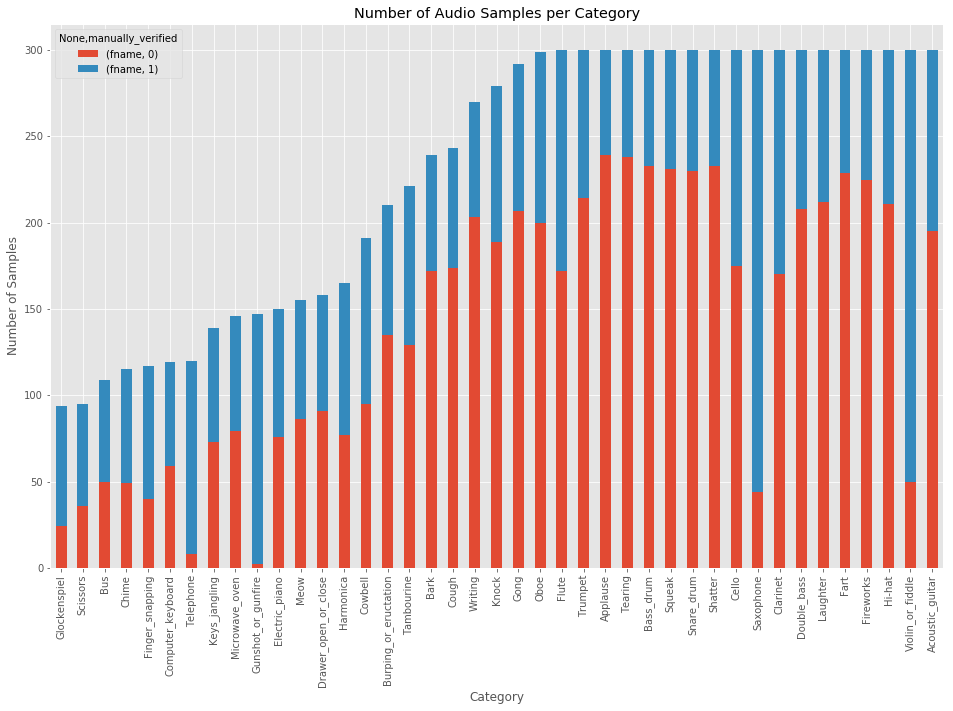

In [5]:
category_group = train.groupby(['label', 'manually_verified']).count()
plot = category_group.unstack().reindex(category_group.unstack().sum(axis=1).sort_values().index)\
          .plot(kind='bar', stacked=True, title="Number of Audio Samples per Category", figsize=(16,10))
plot.set_xlabel("Category")
plot.set_ylabel("Number of Samples");

Total samples (frames) =  (154350,)
[ 4.1569961e-04 -6.4974086e-04  2.8693769e-04 ... -3.6912264e-05
 -5.2365900e-05 -1.1704843e-05]


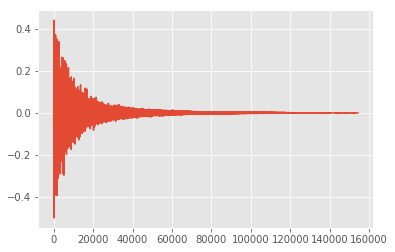

In [6]:
fname = "../../Datasets/freesound-audio-tagging/audio_train/" + "00044347.wav"   # Hi-hat
data, _ = librosa.core.load(fname, sr=SAMPLE_RATE, res_type='kaiser_fast')
print("Total samples (frames) = ", data.shape)
print(data)
IPython.display.display(ipd.Audio(filename=fname))
plt.plot(data, '-', )
plt.show()

Shape:  (40, 44)


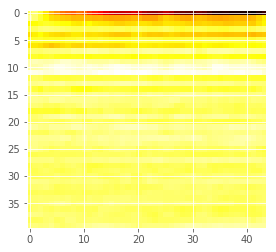

In [7]:
data = data[:2*SAMPLE_RATE]
mfcc = librosa.feature.mfcc(data, sr = SAMPLE_RATE, n_mfcc=40)
print("Shape: ", mfcc.shape)
plt.imshow(mfcc, cmap='hot', interpolation='nearest');

In [ ]:
spec = librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.imshow(spec, cmap='hot', interpolation='nearest');

# GAN Architecture

### Discriminator

In [9]:
d = discriminator(AUDIO_SHAPE)
d.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_1 (Reshape)          (None, 44100, 1)          0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 6299, 32)          384       
_________________________________________________________________
activation_1 (Activation)    (None, 6299, 32)          0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 6299, 32)          128       
_________________________________________________________________
dropout_1 (Dropout)          (None, 6299, 32)          0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 1259, 16)          3600      
_________________________________________________________________
activation_2 (Activation)    (None, 1259, 16)          0         
__________

### Generator

In [10]:
g = generator(NOISE_DIM, AUDIO_SHAPE)
g.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 2100)              1052100   
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 2100)              0         
_________________________________________________________________
batch_normalization_5 (Batch (None, 2100)              8400      
_________________________________________________________________
reshape_2 (Reshape)          (None, 2100, 1)           0         
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 2100, 32)          256       
_________________________________________________________________
activation_4 (Activation)    (None, 2100, 32)          0         
_________________________________________________________________
batch_normalization_6 (Batch (None, 2100, 32)          128       
__________

### Stacked Generator and Discriminator

In [11]:
s = stacked_G_D(g,d)
s.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_2 (Sequential)    (None, 44100)             1690120   
_________________________________________________________________
sequential_1 (Sequential)    (None, 1)                 3443449   
Total params: 5,133,569
Trainable params: 5,125,921
Non-trainable params: 7,648
_________________________________________________________________


### Auto Encoder

In [8]:
trainData = load_train_data(input_length=AUDIO_SHAPE, label = LABEL)
trainData = normalization(trainData)

Data Loaded...
Data Normalized...


In [12]:
e = encoder(AUDIO_SHAPE, ENCODE_SIZE)
a = autoEncoder(e, g)
a.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_4 (Sequential)    (None, 500)               843016    
_________________________________________________________________
sequential_2 (Sequential)    (None, 44100)             1690120   
Total params: 2,533,136
Trainable params: 2,527,544
Non-trainable params: 5,592
_________________________________________________________________


In [20]:
def run_autoEncoder(X, epochs=20,  save_internal=2, batch=32):
    A = autoEncoder()  
    A.compile(loss = 'mse', optimizer = OPTIMIZER, metrics = ['accuracy'])
    for cnt in range(epochs):
        random_index = np.random.randint(0, len(X) - batch)
        legit_audios = X[random_index : int(random_index + batch)]
        loss = A.train_on_batch( legit_audios, legit_audios)
        if cnt % save_internal == 0 : 
            print("Epoch: ", cnt, ", Loss: ", loss)
    return A

start = time.time()
auto = run_autoEncoder(trainData, epochs=100, save_internal=10, batch=64)
end = time.time()
total = round(end- start,2)
print("\nExecution Time: ",total,"s")

Epoch:  0 , Loss:  [1.6564443, 0.0]
Epoch:  10 , Loss:  [1.2964363, 0.0]
Epoch:  20 , Loss:  [1.1658373, 0.0]
Epoch:  30 , Loss:  [1.1932416, 0.0]
Epoch:  40 , Loss:  [1.3748015, 0.0]
Epoch:  50 , Loss:  [0.6075822, 0.0]
Epoch:  60 , Loss:  [1.0254648, 0.0]
Epoch:  70 , Loss:  [1.004713, 0.0]
Epoch:  80 , Loss:  [0.9469638, 0.0]
Epoch:  90 , Loss:  [0.6210789, 0.0]

Execution Time:  210.86 s


Original:


Result:


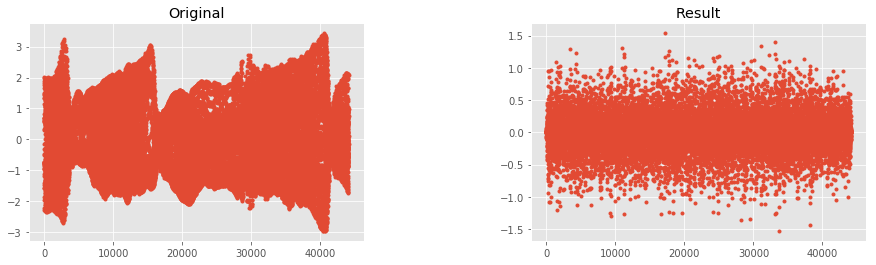

In [23]:
INDEX = 3
sample = trainData[INDEX]

print("Original:")
IPython.display.display(ipd.Audio(data=sample, rate=SAMPLE_RATE))
librosa.output.write_wav(AUTO_ENCODER_PATH + "AE_Original_" + LABEL + ".wav", y=sample, sr=SAMPLE_RATE , norm=True)
result = auto.predict(sample.reshape((1,SHAPE))).flatten()

print("Result:")
IPython.display.display(ipd.Audio(data=result, rate=SAMPLE_RATE))
librosa.output.write_wav(AUTO_ENCODER_PATH + "AE_Result_" + LABEL + ".wav", y=result, sr=SAMPLE_RATE , norm=True)

fig      = plt.figure(figsize=(1, 2))
Original = fig.add_subplot(1, 2, 1)
Result   = fig.add_subplot(1, 2, 2)

Original.set_title('Original')
Result.set_title('Result')

Original.plot(sample, '.', )
Result.plot(result, '.', )


plt.gcf().set_size_inches(15, 4)
plt.subplots_adjust(wspace=0.5,hspace=0.3)
plt.show()

ori_ext  = Original.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
res_ext  = Result.get_window_extent().transformed(fig.dpi_scale_trans.inverted())

fig.savefig(PICTURE_PATH + "AE_Original_"+ LABEL + ".png", bbox_inches=ori_ext.expanded(1.2, 1.2))
fig.savefig(PICTURE_PATH + "AE_Result_"+ LABEL + ".png", bbox_inches=res_ext.expanded(1.2, 1.2))

# Audio GAN 

In [13]:
myGan = AudioGAN(label = LABEL)

Data Loaded...
Data Normalized...


### Running GAN

epoch: 0
Discriminator_loss: 2.788320, Generator_loss: 4.169733


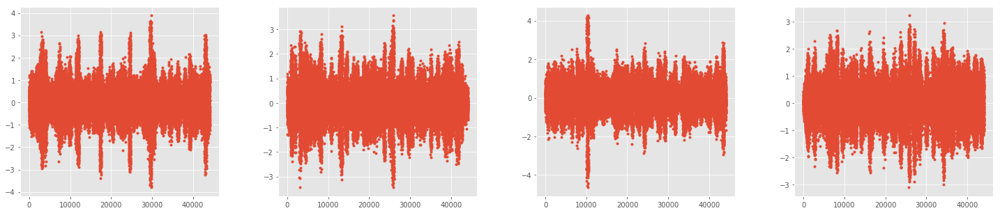

epoch: 5
Discriminator_loss: 1.773263, Generator_loss: 4.238943
epoch: 10
Discriminator_loss: 1.163316, Generator_loss: 4.692245


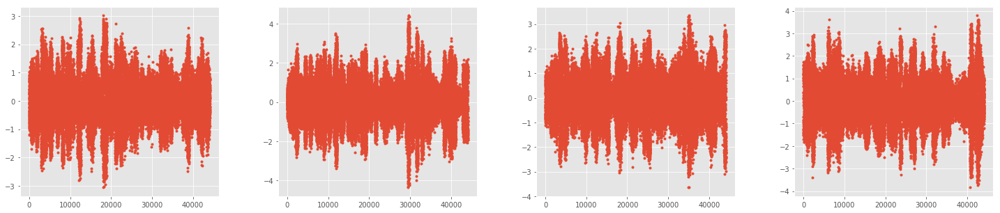

epoch: 15
Discriminator_loss: 1.015293, Generator_loss: 3.871635
epoch: 20
Discriminator_loss: 1.689450, Generator_loss: 4.071860


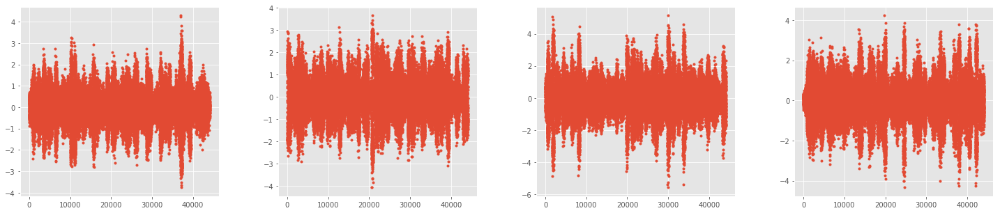

epoch: 25
Discriminator_loss: 0.582597, Generator_loss: 4.082766
epoch: 30
Discriminator_loss: 1.502758, Generator_loss: 4.539475


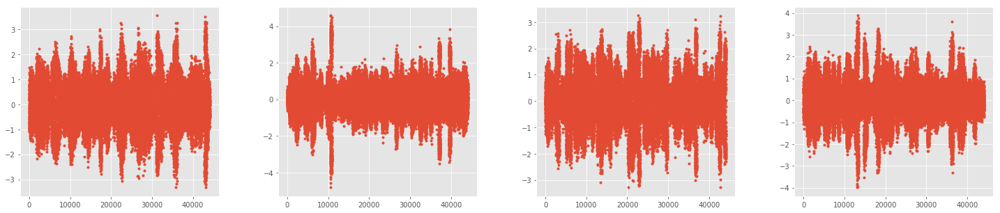

epoch: 35
Discriminator_loss: 1.304396, Generator_loss: 4.295667
epoch: 40
Discriminator_loss: 1.037890, Generator_loss: 4.678411


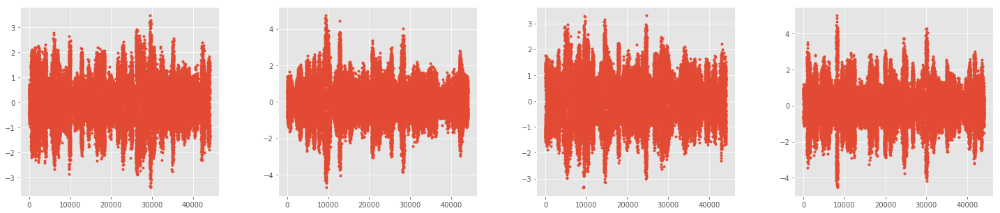

epoch: 45
Discriminator_loss: 0.952740, Generator_loss: 4.065438
epoch: 50
Discriminator_loss: 0.775352, Generator_loss: 3.613505


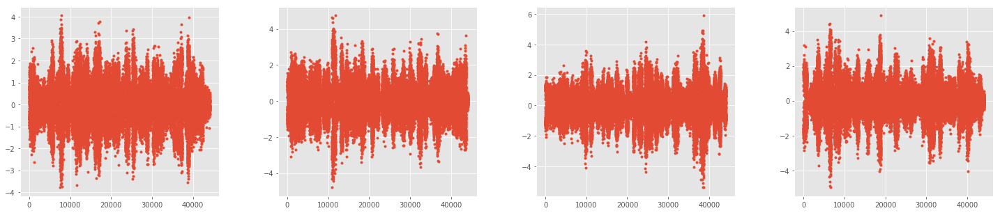

epoch: 55
Discriminator_loss: 1.125603, Generator_loss: 4.169190
epoch: 60
Discriminator_loss: 1.012446, Generator_loss: 3.728400


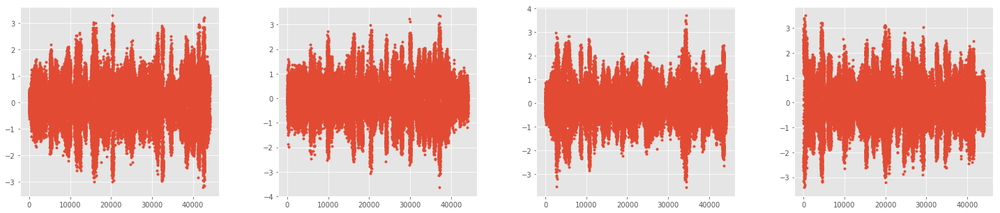

epoch: 65
Discriminator_loss: 0.978624, Generator_loss: 3.981458
epoch: 70
Discriminator_loss: 0.595271, Generator_loss: 3.607403


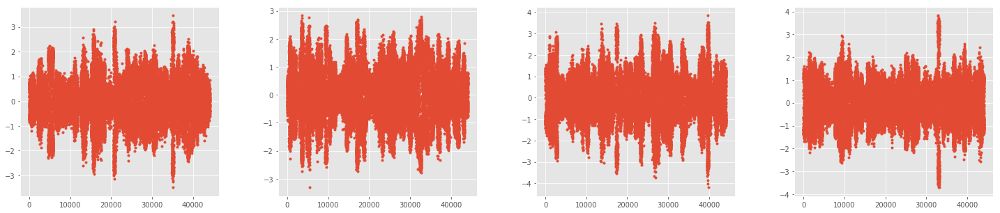

epoch: 75
Discriminator_loss: 0.344790, Generator_loss: 4.083280
epoch: 80
Discriminator_loss: 0.490497, Generator_loss: 4.073198


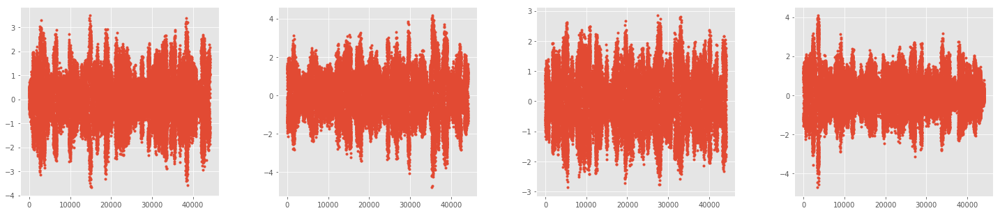

epoch: 85
Discriminator_loss: 0.592147, Generator_loss: 3.858284
epoch: 90
Discriminator_loss: 0.930657, Generator_loss: 3.590572


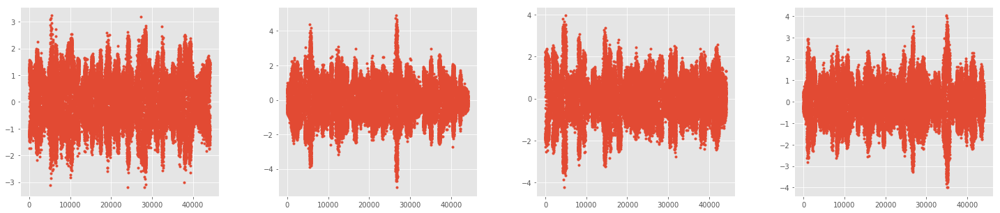

epoch: 95
Discriminator_loss: 0.692939, Generator_loss: 3.763421
Execution Time:  1494.79 s


In [14]:
start = time.time()
myGan.train(epochs = 100, batch = 64, save_interval = 10)
end = time.time()
total = round(end - start,2)
print("Execution Time: ", total, "s")

### Discriminator and Generator Loss over Epochs

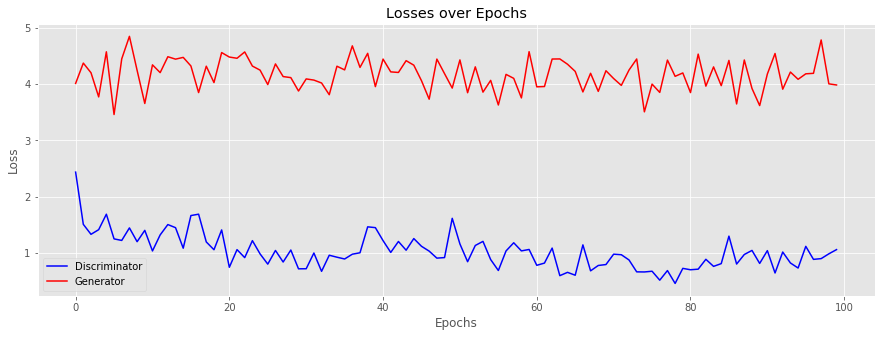

In [212]:
plt.title('Losses over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.plot(myGan.D_loss_hist, '-', label='Discriminator', color='blue')
plt.plot(myGan.G_loss_hist, '-', label='Generator', color='red')
plt.legend(loc='best')

plt.gcf().set_size_inches(15, 5)
gen_plt.savefig(PICTURE_PATH + "D_G_Loss.png")
plt.show()

### Test Sample

Generated Audio


Original Audio


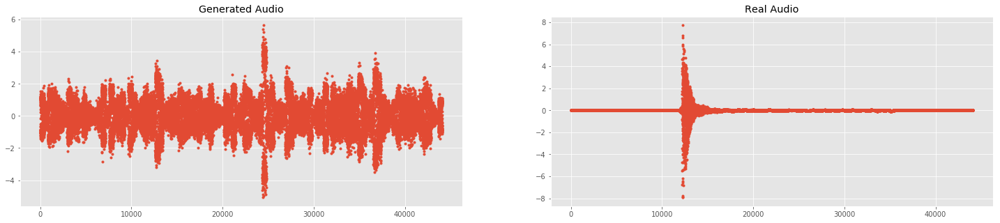

In [26]:
fig = plt.figure(figsize=(1, 2))
gen_plt = fig.add_subplot(1, 2, 1)
ori_plt = fig.add_subplot(1, 2, 2)

gen_plt.set_title('Generated Audio')
ori_plt.set_title('Real Audio')

gen_noise = np.random.normal(0, 1, (1,NOISE_DIM))
gen_test = myGan.G.predict(gen_noise).flatten()

random_index = np.random.randint(0, len(myGan.X_train))
original = myGan.X_train[random_index]

print("Generated Audio")
IPython.display.display(ipd.Audio(data=gen_test, rate=SAMPLE_RATE))
librosa.output.write_wav(GAN_PATH + "G_GAN_" + LABEL +'.wav', y=gen_test, sr=SAMPLE_RATE , norm=True)
print("Original Audio")
IPython.display.display(ipd.Audio(data=original, rate=SAMPLE_RATE))

gen_plt.plot(gen_test, '.', )
ori_plt.plot(original, '.', )

plt.gcf().set_size_inches(25, 5)
plt.subplots_adjust(wspace=0.2,hspace=0.3)
plt.show()

gen_ext  = gen_plt.get_window_extent().transformed(fig.dpi_scale_trans.inverted())

fig.savefig(PICTURE_PATH + "G_GAN_"+ LABEL + ".png", bbox_inches=gen_ext.expanded(1.2, 1.2))

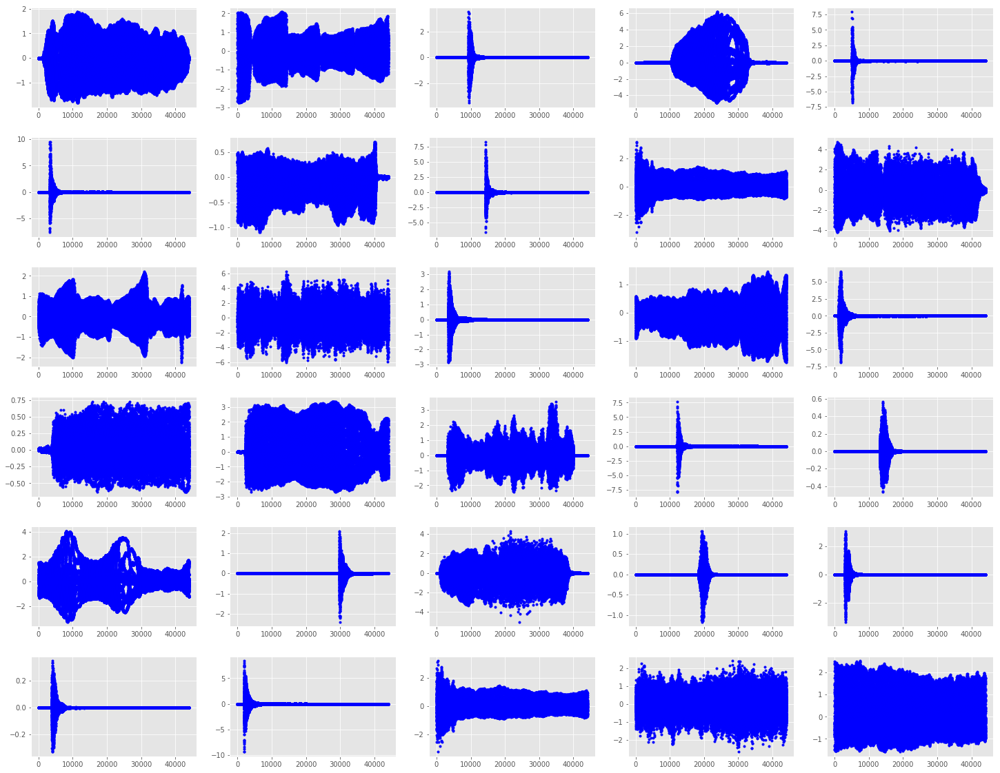

In [23]:
lin, col = 6, 5
fig = plt.figure(figsize=(lin, col))
subPlotS = []
for i in range(lin):
    for j in range(col):
        subPlotS.append(fig.add_subplot(lin , col, (i*col)+j+1))
        
        
for i in range(lin):
    for j in range(col):
        random_index = np.random.randint(0, len(myGan.X_train))
        original = myGan.X_train[random_index]
        IPython.display.display(ipd.Audio(data=original, rate=SAMPLE_RATE))
        subPlotS[(i*col)+j].plot(original, '.', color='blue')

gen_noise = np.random.normal(0, 1, (1,NOISE_DIM))
gen_test = myGan.G.predict(gen_noise).flatten()

plt.gcf().set_size_inches(25, 20)
plt.subplots_adjust(wspace=0.2,hspace=0.3)
plt.show()
